# Capstone 3
## Deep Learning for Amazon Rainforest Monitoring
### Data Wrangling & EDA

In [1]:
from fastai.vision import *
from pathlib import Path
import zipfile
import os
import shutil
import cv2

import pandas as pd
import numpy as np
from collections import Counter
from sklearn.preprocessing import MultiLabelBinarizer

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import matplotlib.image as mpimg

from IPython.display import display
from skimage import io

import warnings
warnings.filterwarnings('ignore')

import os
from tensorflow.keras.preprocessing import image
from math import ceil


Firstly, I began the data collection by accessing the Kaggle API, using my personal credentials to ensure secure retrieval:

In [2]:
#!pip install kaggle
#! mkdir -p ~/.kaggle/
#! mv kaggle.json ~/.kaggle/
#!kaggle competitions download -c 'planet-understanding-the-amazon-from-space'

The dataset is in a compressed zip format. To extract its contents, I used the following code:

In [3]:
zip_path = 'planet-understanding-the-amazon-from-space.zip'
extract_to = 'data'

if not os.path.exists(extract_to):
    os.makedirs(extract_to)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f'Contents extracted to {extract_to}')

Contents extracted to data


In [4]:
path = Path('/Users/daiannestarr/Desktop/Springboard/Capstone3/data')

contents = path.iterdir()
for item in contents:
    print(item)

/Users/daiannestarr/Desktop/Springboard/Capstone3/data/planet
/Users/daiannestarr/Desktop/Springboard/Capstone3/data/.DS_Store
/Users/daiannestarr/Desktop/Springboard/Capstone3/data/planets-dataset.zip
/Users/daiannestarr/Desktop/Springboard/Capstone3/data/sample_submission_v2.csv
/Users/daiannestarr/Desktop/Springboard/Capstone3/data/test_v2_file_mapping.csv
/Users/daiannestarr/Desktop/Springboard/Capstone3/data/train_v2.csv
/Users/daiannestarr/Desktop/Springboard/Capstone3/data/test-jpg-additional
/Users/daiannestarr/Desktop/Springboard/Capstone3/data/Kaggle-planet-test-tif.torrent
/Users/daiannestarr/Desktop/Springboard/Capstone3/data/Kaggle-planet-train-tif.torrent
/Users/daiannestarr/Desktop/Springboard/Capstone3/data/planets-dataset


Turns out, the dataset came with only torrent files, not the images I was expecting. 

I attempted to download the images through a web-based torrent client, but the sheer size of the files — 19GB and 13GB — meant it would take a considerable amount of time. 

After some research, I discovered that someone had re-uploaded the images directly on Kaggle:

In [5]:
# !kaggle datasets download nikitarom/planets-dataset -p "{path}"
# !unzip -q -n '{path}'/planets-dataset.zip -d '{path}'

In [6]:
path = Path('/Users/daiannestarr/Desktop/Springboard/Capstone3/kaggle/planet/planet')

contents = path.iterdir()
for item in contents:
    print(item)

/Users/daiannestarr/Desktop/Springboard/Capstone3/kaggle/planet/planet/train-jpg-resized
/Users/daiannestarr/Desktop/Springboard/Capstone3/kaggle/planet/planet/.DS_Store
/Users/daiannestarr/Desktop/Springboard/Capstone3/kaggle/planet/planet/train_classes.csv
/Users/daiannestarr/Desktop/Springboard/Capstone3/kaggle/planet/planet/test-jpg
/Users/daiannestarr/Desktop/Springboard/Capstone3/kaggle/planet/planet/sample_submission.csv
/Users/daiannestarr/Desktop/Springboard/Capstone3/kaggle/planet/planet/train-jpg


Great! The images were sucessfully downloaded!

---

## Data Exploration

In [7]:
test_file_mapping = pd.read_csv('kaggle/planet/planet/sample_submission.csv')
train_labels = pd.read_csv('kaggle/planet/planet/train_classes.csv')

print(test_file_mapping.head())
print(train_labels.head())
train_labels

  image_name                                  tags
0     test_0  primary clear agriculture road water
1     test_1  primary clear agriculture road water
2     test_2  primary clear agriculture road water
3     test_3  primary clear agriculture road water
4     test_4  primary clear agriculture road water
  image_name                                       tags
0    train_0                               haze primary
1    train_1            agriculture clear primary water
2    train_2                              clear primary
3    train_3                              clear primary
4    train_4  agriculture clear habitation primary road


,image_name,tags
0,train_0,haze primary
1,train_1,agriculture clear primary water
2,train_2,clear primary
3,train_3,clear primary
4,train_4,agriculture clear habitation primary road
...,...,...
40474,train_40474,clear primary
40475,train_40475,cloudy
40476,train_40476,agriculture clear primary
40477,train_40477,agriculture clear primary road


In both datasets, each image is associated with multiple labels  within the variable 'tags'. 

The variable 'tags' represent different classifications of the images, illustrating the multi-label nature of the dataset.

In [8]:
#check for null values
print(train_labels.isnull().sum())

image_name    0
tags          0
dtype: int64


In [9]:
tag_counts = train_labels['tags'].value_counts()
print(tag_counts.info())
print(tag_counts.describe())

<class 'pandas.core.series.Series'>
Index: 449 entries, clear primary to agriculture partly_cloudy primary road conventional_mine
Series name: tags
Non-Null Count  Dtype
--------------  -----
449 non-null    int64
dtypes: int64(1)
memory usage: 7.0+ KB
None
count      449.000000
mean        90.153675
std        695.896878
min          1.000000
25%          1.000000
50%          3.000000
75%         12.000000
max      13636.000000
Name: tags, dtype: float64


* The total number of unique tag combinations is 449.
* On average, a unique tag combination appears about 90 times in the dataset.
* However, the distribution is highly skewed, as indicated by the large standard deviation (~696).
* The median frequency of a tag combination is 3 times, with 25% of the tag combinations appearing only once.
* The most frequent tag combination is 'clear primary', which appears 13,636 times.

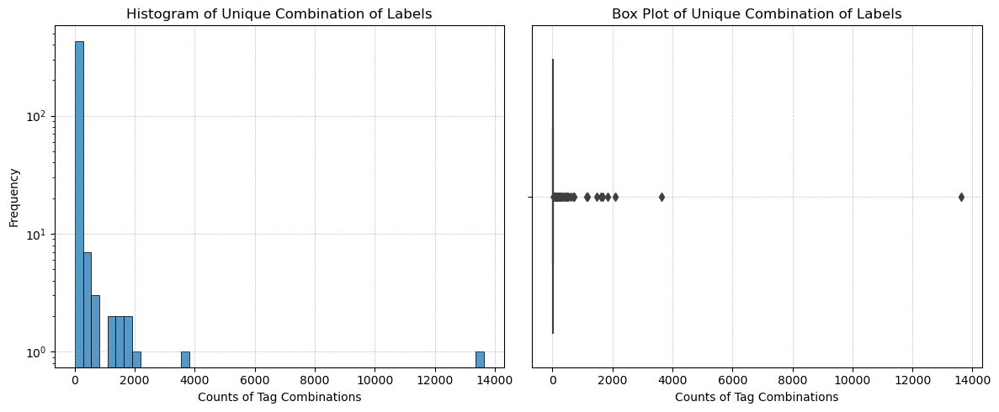

In [10]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

# Histogram of the tag counts
sns.histplot(tag_counts, bins=50, kde=False, ax=axes[0])
axes[0].set_title('Histogram of Unique Combination of Labels')
axes[0].set_xlabel('Counts of Tag Combinations')
axes[0].set_ylabel('Frequency')
axes[0].grid(axis='y', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
axes[0].grid(axis='x', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
axes[0].set_yscale('log')


# Boxplot of the tag counts
sns.boxplot(x=tag_counts, ax=axes[1])
axes[1].set_title('Box Plot of Unique Combination of Labels')
axes[1].set_xlabel('Counts of Tag Combinations')
axes[1].grid(axis='y', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
axes[1].grid(axis='x', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)

plt.tight_layout()
plt.show()

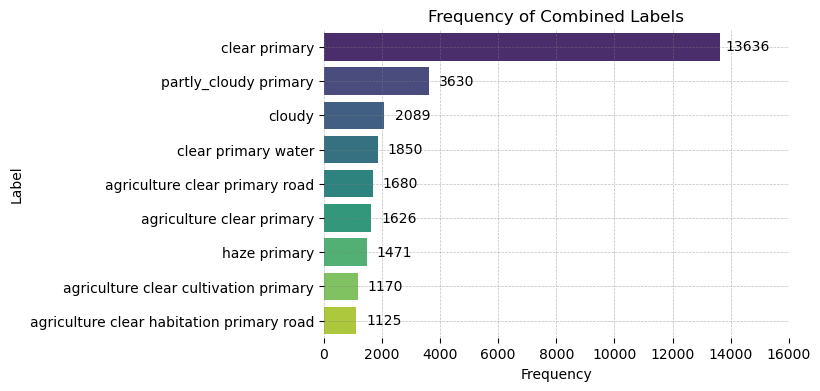

In [11]:
tags_df = pd.DataFrame(tag_counts.items(), columns=['Tag', 'Count']).sort_values(by='Count', ascending=False)
tags_df_filtered = tags_df[tags_df['Count'] > 1000]

# Barplot with the number for each bar plotted after the bar
plt.figure(figsize=(6,4 ))
barplot = sns.barplot(x='Count', y='Tag', data=tags_df_filtered, palette='viridis')
plt.title('Frequency of Combined Labels')
plt.xlabel('Frequency')
plt.ylabel('Label')
plt.grid(axis='y', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
plt.grid(axis='x', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
plt.xlim(0, 16000)
plt.box(False)

for p in barplot.patches:
    barplot.annotate(format(p.get_width(), '.0f'), 
                     (p.get_width(), p.get_y() + p.get_height() / 2.), 
                     ha = 'center', va = 'center', 
                     xytext = (20, 0), 
                     textcoords = 'offset points')

plt.show()

The histogram on the left shows the frequency of the number of occurrences for each unique combination of tags. Since most tag combinations occur infrequently (as indicated by the peak at the left side of the histogram), the data is highly skewed with a long tail to the right. This long tail represents the few tag combinations that occur very often, which are the outliers in this distribution.

The box plot on the right shows the same distribution with a focus on the quartiles and outliers. The few tag combinations with very high counts likely represent common features or conditions and are outliers compared to the rest.

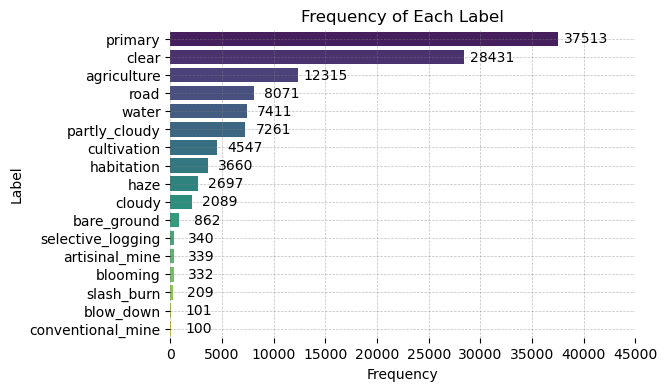

In [12]:
# Splitting tags
all_tags = [tag for sublist in train_labels['tags'].str.split() for tag in sublist]
tag_counts = Counter(all_tags)
tags_df = pd.DataFrame(tag_counts.items(), columns=['Tag', 'Count']).sort_values(by='Count', ascending=False)

# Barplot with the number for each bar plotted after the bar
plt.figure(figsize=(6,4 ))
barplot = sns.barplot(x='Count', y='Tag', data=tags_df, palette='viridis')
plt.title('Frequency of Each Label')
plt.xlabel('Frequency')
plt.ylabel('Label')
plt.grid(axis='y', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
plt.grid(axis='x', linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
plt.xlim(0, 45000)
plt.box(False)

for p in barplot.patches:
    barplot.annotate(format(p.get_width(), '.0f'), 
                     (p.get_width(), p.get_y() + p.get_height() / 2.), 
                     ha = 'center', va = 'center', 
                     xytext = (20, 0), 
                     textcoords = 'offset points')

plt.show()

The most common tag is primary, present in 37,513 images, followed by clear, agriculture, road, and water. These tags likely represent the most prevalent features or conditions within the images.

---

## Correlation Analysis

In [13]:
train_labels['tags_list'] = train_labels['tags'].str.split()

mlb = MultiLabelBinarizer()
one_hot_encoded_tags = mlb.fit_transform(train_labels['tags_list'])
one_hot_encoded_df = pd.DataFrame(one_hot_encoded_tags, columns=mlb.classes_)
correlation_matrix = one_hot_encoded_df.corr()


In [14]:
correlation_matrix

,agriculture,artisinal_mine,bare_ground,blooming,blow_down,clear,cloudy,conventional_mine,cultivation,habitation,haze,partly_cloudy,primary,road,selective_logging,slash_burn,water
agriculture,1.000000,-0.038379,-0.013854,-0.041082,-0.008538,0.058765,-0.154252,-0.006948,0.344964,0.303979,-0.031978,0.039743,0.115259,0.480930,-0.022616,0.041518,0.063498
artisinal_mine,-0.038379,1.000000,0.061556,-0.008357,-0.004527,0.040851,-0.021437,0.017270,-0.016849,-0.001561,-0.019118,-0.023888,0.010236,0.028774,0.009365,-0.006621,0.166084
bare_ground,-0.013854,0.061556,1.000000,-0.007722,0.006661,0.052982,-0.034409,0.027131,-0.003458,0.050756,-0.011276,-0.035959,-0.076070,0.064728,0.010800,0.013250,0.021320
blooming,-0.041082,-0.008357,-0.007722,1.000000,0.001094,0.046617,-0.021213,-0.004525,-0.001502,-0.024851,-0.019903,-0.030380,0.025570,-0.038526,0.012640,0.001092,-0.031718
blow_down,-0.008538,-0.004527,0.006661,0.001094,1.000000,0.017776,-0.011492,-0.002452,-0.004550,-0.010273,-0.013162,-0.005999,0.013852,-0.022068,0.000974,0.010479,-0.019422
clear,0.058765,0.040851,0.052982,0.046617,0.017776,1.000000,-0.358343,-0.000257,0.065897,0.097849,-0.410428,-0.718208,0.273743,0.084686,0.040967,0.019757,0.041464
cloudy,-0.154252,-0.021437,-0.034409,-0.021213,-0.011492,-0.358343,1.000000,-0.011609,-0.082260,-0.073547,-0.062324,-0.109062,-0.829594,-0.116412,-0.021469,-0.016805,-0.110432
conventional_mine,-0.006948,0.017270,0.027131,-0.004525,-0.002452,-0.000257,-0.011609,1.000000,-0.011202,0.046781,-0.009305,0.013052,0.002535,0.048653,-0.004580,-0.003585,0.009898
cultivation,0.344964,-0.016849,-0.003458,-0.001502,-0.004550,0.065897,-0.082260,-0.011202,1.000000,0.134639,-0.030414,-0.011306,0.092507,0.079122,0.017603,0.113073,0.009845
habitation,0.303979,-0.001561,0.050756,-0.024851,-0.010273,0.097849,-0.073547,0.046781,0.134639,1.000000,-0.039675,-0.048390,0.025513,0.443341,-0.016747,0.026567,0.054555


In [15]:
pd.set_option('display.float_format', lambda x: '%.2f' % x)

one_hot_encoded_df.describe()

,agriculture,artisinal_mine,bare_ground,blooming,blow_down,clear,cloudy,conventional_mine,cultivation,habitation,haze,partly_cloudy,primary,road,selective_logging,slash_burn,water
count,40479.00,40479.00,40479.00,40479.00,40479.00,40479.00,40479.00,40479.00,40479.00,40479.00,40479.00,40479.00,40479.00,40479.00,40479.00,40479.00,40479.00
mean,0.30,0.01,0.02,0.01,0.00,0.70,0.05,0.00,0.11,0.09,0.07,0.18,0.93,0.20,0.01,0.01,0.18
std,0.46,0.09,0.14,0.09,0.05,0.46,0.22,0.05,0.31,0.29,0.25,0.38,0.26,0.40,0.09,0.07,0.39
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00
50%,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00
75%,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00
max,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


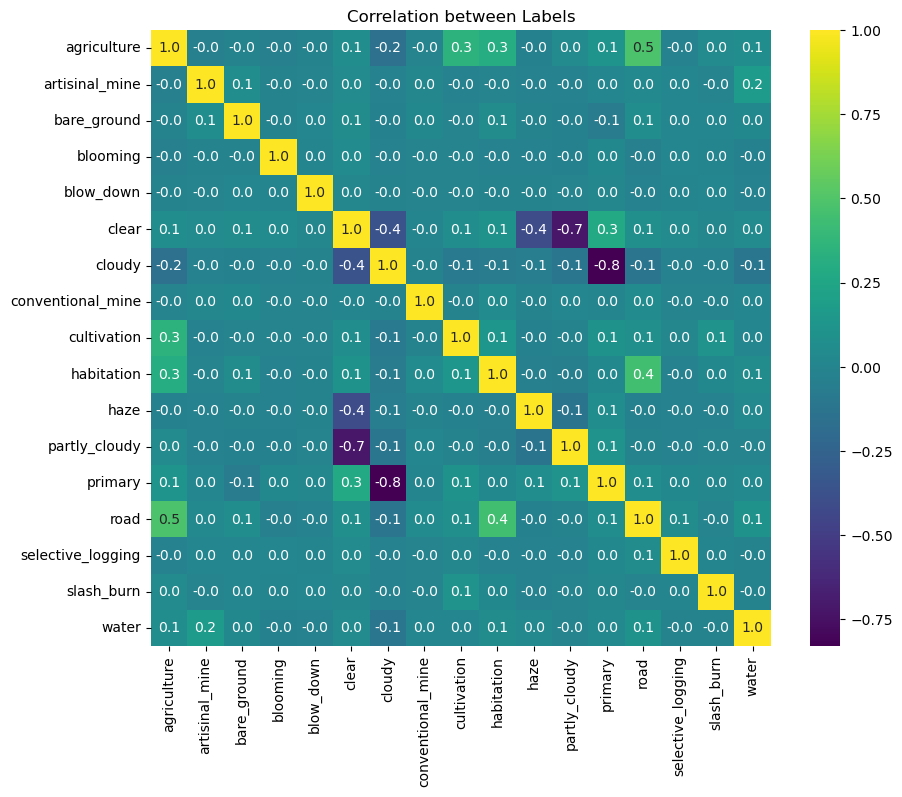

In [16]:
# Plot the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='viridis',annot=True, fmt=".1f")
plt.title('Correlation between Labels')
plt.savefig('correlation_matrix.png')
plt.show()

The correlation heatmap displays how tags are related to each other. For example, some tags such as 'primary' and 'cloudy' frequently occur together, suggesting a relationship between the features they represent.

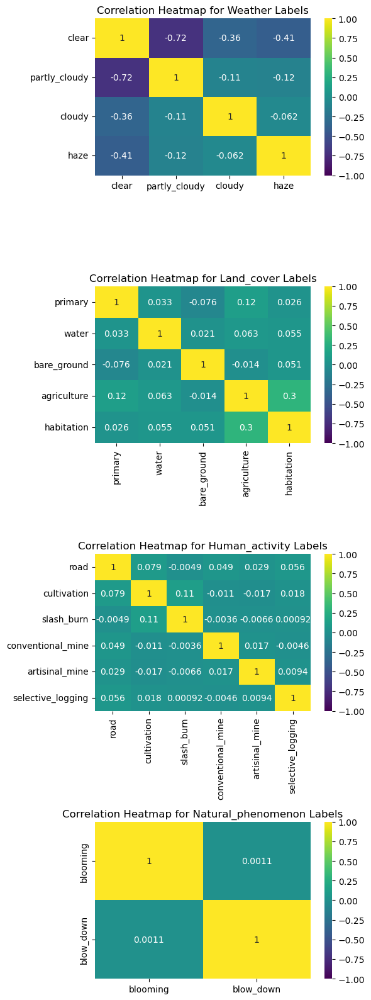

In [17]:
tag_categories = {
    'weather': ['clear', 'partly_cloudy', 'cloudy', 'haze'],
    'land_cover': ['primary', 'water', 'bare_ground', 'agriculture', 'habitation'],
    'human_activity': ['road', 'cultivation', 'slash_burn', 'conventional_mine', 'artisinal_mine', 'selective_logging'],
    'natural_phenomenon': ['blooming', 'blow_down']
}

# Recalculate the correlation matrix using the correct one-hot encoded data
correlation_matrix = one_hot_encoded_df.corr()

# Dictionary to hold the filtered correlation matrices for each tag category
filtered_correlation_matrices = {}

# Calculate the correlation matrix for each category
for category, tags_list in tag_categories.items():
    # Filter the correlation matrix for the tags in the current category
    filtered_correlation_matrix = correlation_matrix.loc[tags_list, tags_list]
    filtered_correlation_matrices[category] = filtered_correlation_matrix

# Plotting
fig, axes = plt.subplots(nrows=len(tag_categories), figsize=(6, 4 * len(tag_categories)))

# In case of a single category, ensure axes is iterable
if not isinstance(axes, np.ndarray):
    axes = [axes]

for ax, (category, matrix) in zip(axes, filtered_correlation_matrices.items()):
    sns.heatmap(matrix, annot=True, cmap='viridis', ax=ax, vmin=-1, vmax=1)
    ax.set_title(f'Correlation Heatmap for {category.capitalize()} Labels')

plt.tight_layout()
plt.show()

Based on the co-occurrence matrix for each category:

* **Wheather Labels** describe the atmospheric conditions captured in the images. A strong negative correlation exists between 'clear' and 'partially_cloudy', as well as between 'haze' and 'clear'. This suggests that these tags do not typically appear together in the images. Furthermore, it appears that each image is associated with a single weather label.

* **Land Cover Labels** encompass tags related to the type of land cover, including water bodies and vegetation, as well as human-altered landscapes like agricultural areas and habitations. There is no clear linear relationship in the occurrence of these tags. The highest correlation coefficient observed is 0.3, which is between 'agriculture' and 'habitation'. However, this correlation is not particularly strong, suggesting that only a few images depict settled farmlands.

* **Human Activity Labels** are associated with various human activities and their impact on the landscape, such as roads, agricultural cultivation, and slash-and-burn practices. The correlation values are close to zero, indicating no significant linear relationship in the occurrence of these tags.

* **Natural Phenomenon Labels** represent natural phenomena. These tags exhibit the lowest correlation values among all the categories, suggesting no discernible linear relationship in their occurrence. This lack of correlation is expected due to the random nature of such phenomena.

---

## Image check

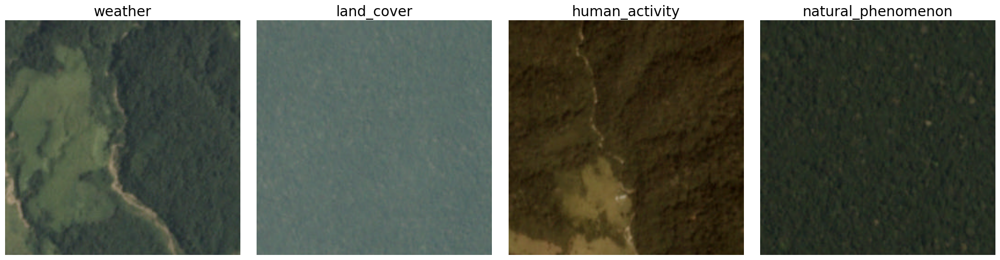

In [18]:
## checking the general categories

image_dir = '/Users/daiannestarr/Desktop/Springboard/Capstone3/kaggle/planet/planet/train-jpg'

example_images = {}

for category, tags_list in tag_categories.items():
    for tag in tags_list:
        matching_images = train_labels[train_labels['tags'].str.contains(tag)]
        if not matching_images.empty:
            image_name = matching_images.iloc[0]['image_name']
            example_images[category] = os.path.join(image_dir, image_name + '.jpg')
            break

num_images = len(example_images)
plt.figure(figsize=(num_images * 5, 5))
for i, (category, image_path) in enumerate(example_images.items(), 1):
    img = mpimg.imread(image_path)
    plt.subplot(1, num_images, i)
    plt.imshow(img)
    plt.title(category, fontsize=20) 
    plt.axis('off')
plt.tight_layout()
plt.show()

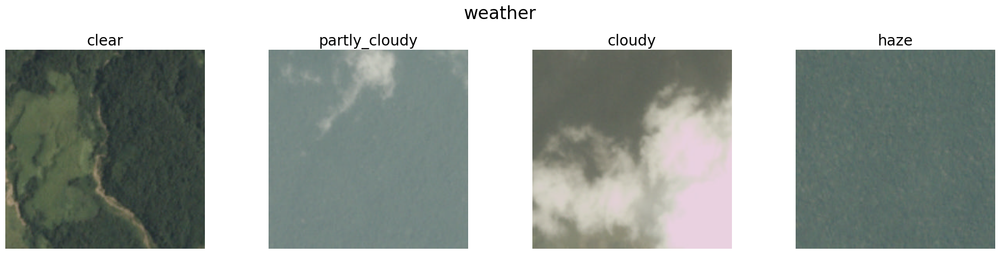

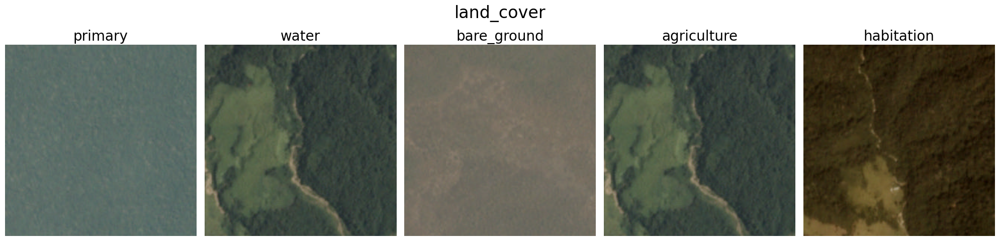

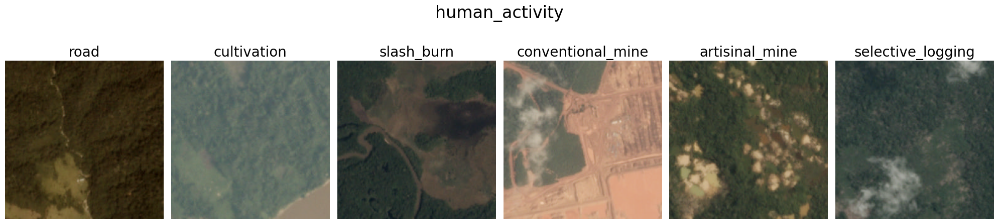

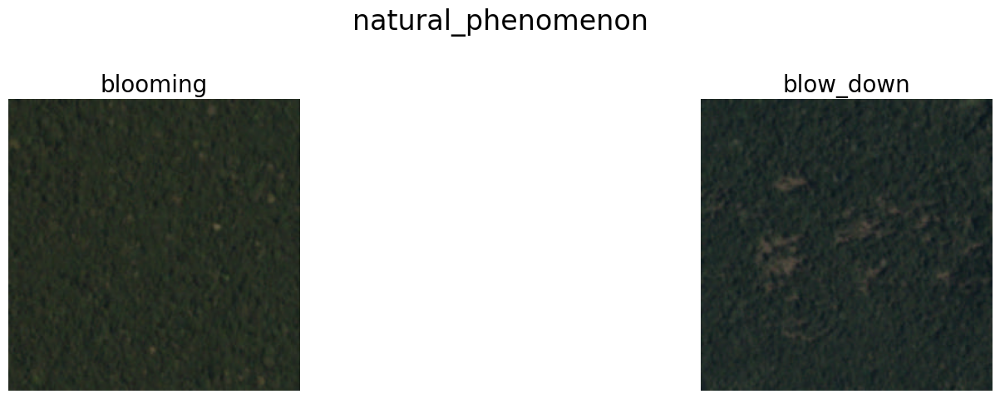

In [19]:
## checking the elements inside of the general categories

def get_image_path(tag):
    matching_images = train_labels[train_labels['tags'].str.contains(tag)]
    if not matching_images.empty:
        return os.path.join(image_dir, matching_images.iloc[0]['image_name'] + '.jpg')
    return None

example_images = {category: {} for category in tag_categories}

for category, tags_list in tag_categories.items():
    for tag in tags_list:
        image_path = get_image_path(tag)
        if image_path:
            example_images[category][tag] = image_path

for category, tags in example_images.items():
    plt.figure(figsize=(20, 5)) 
    plt.suptitle(category, fontsize=24)
    for i, (tag, image_path) in enumerate(tags.items(), 1):
        plt.subplot(1, len(tags), i)
        img = mpimg.imread(image_path)
        plt.imshow(img)
        plt.title(tag, fontsize=20)
        plt.axis('off')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) 
    plt.show()

For both approaches, the tags are representative of the images they are displaying.

---

## Image Inspection

This image inspection code is modified from [ithisted project](https://github.com/ithisted/AmazonImageClassification/blob/215d0e2bdc3742716d8be3e2658a976004a69ef7/notebooks/1_PlanetAmazonImageClassification%20-%20EDA.ipynb) that used the same dataset that I'm using but he has a different approach to this problem.

(256, 256, 3)


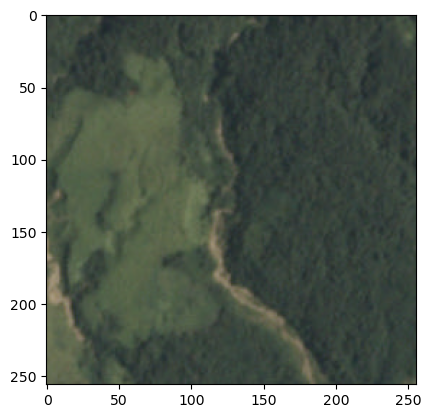

In [20]:
# Write function to get a specific image
def load_image(file_name, type='jpg'):
    img_path = ('./data/planet/planet/train-{}/{}.{}').format(type,file_name,type)
    img = io.imread(img_path)
    return img

image = load_image('train_1')
plt.imshow(image)
print(image.shape)

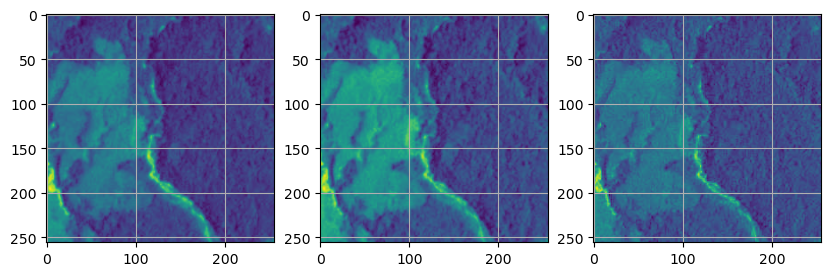

In [21]:
#Breaking down color channels
def extract_rgb(image):
    r, g, b = image[:, :, 0], image[:, :, 1], image[:, :, 2]
    return r, g, b

r, g, b = extract_rgb(image)

fig, axs = plt.subplots(1, 3, figsize=(10, 3))

#Display all 3 channels
for ax, fig in zip(axs,[r,g,b]):
    ax.imshow(fig)
    ax.grid(True)

## Find average RGB values for each category and each image

In [22]:
train_labels = pd.read_csv('kaggle/planet/planet/train_classes.csv')

# Split the 'tags' column into a list of tags
train_labels['tags'] = train_labels['tags'].str.split()

# Explode the 'tags' lists into separate rows
expanded_train_labels = train_labels.explode('tags')
# expanded_train_labels = expanded_train_labels.drop('tag_list', axis=1)

# Join the one-hot encoded DataFrame with the original 'image_name' column
one_hot_encoded_df_with_names = train_labels[['image_name']].join(one_hot_encoded_df)


In [23]:
# Define the load_image function
def load_image(image_name):
    # Update this path to the directory where your images are stored
    path = f'kaggle/planet/planet/train-jpg/{image_name}.jpg'
    img = cv2.imread(path)
    return img

def extract_rgb(image):
    # Convert BGR to RGB
    rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    r, g, b = cv2.split(rgb_image)
    return r, g, b

# Create a dictionary to store image names for each label
image_names_dict = {}
for label in one_hot_encoded_df_with_names.columns[1:]:  # Skipping 'image_name' column
    image_names = one_hot_encoded_df_with_names[one_hot_encoded_df_with_names[label] == 1]['image_name']
    image_names_dict[label] = list(image_names.values)

# Dictionary to store mean RGB values
mean_rgb_label_dict = {}

# Iterate over each label and calculate mean RGB values
for label, image_names in image_names_dict.items():
    reds, greens, blues = [], [], []
    
    for image_name in image_names:
        image = load_image(image_name)
        if image is not None:
            r, g, b = extract_rgb(image)
            reds.append(np.mean(r))
            greens.append(np.mean(g))
            blues.append(np.mean(b))

    # Calculate overall mean RGB values
    red_mean = np.mean(reds) if reds else 0
    green_mean = np.mean(greens) if greens else 0
    blue_mean = np.mean(blues) if blues else 0
        
    mean_rgb_label_dict[label] = {'red': red_mean, 'green': green_mean, 'blue': blue_mean}
    
    print(f"Processed label: {label}")


Processed label: agriculture
Processed label: artisinal_mine
Processed label: bare_ground
Processed label: blooming
Processed label: blow_down
Processed label: clear
Processed label: cloudy
Processed label: conventional_mine
Processed label: cultivation
Processed label: habitation
Processed label: haze
Processed label: partly_cloudy
Processed label: primary
Processed label: road
Processed label: selective_logging
Processed label: slash_burn
Processed label: water


In [24]:
mean_rgb_label_df = pd.DataFrame.from_dict(mean_rgb_label_dict).T
mean_rgb_label_df.to_csv('mean_RGB.csv')

In [25]:
mean_rgb_df = pd.read_csv('mean_RGB.csv', index_col=0)
mean_rgb_df['intensity'] = mean_rgb_df.red + mean_rgb_df.green + mean_rgb_df.blue
mean_rgb_df.sort_values("intensity", axis = 0, ascending = False, inplace = True)
mean_rgb_df = mean_rgb_df.iloc[:,0:3]
mean_rgb_df

,red,green,blue
cloudy,159.97,161.03,150.45
haze,118.53,124.86,114.74
artisinal_mine,117.44,111.59,89.02
conventional_mine,115.07,104.04,88.03
partly_cloudy,91.95,98.69,88.03
road,96.61,98.42,83.54
habitation,95.52,96.87,81.03
agriculture,92.66,96.12,82.28
water,91.53,95.51,83.30
bare_ground,97.87,93.93,75.96


In [26]:
# This section calculates average RGB values per image
####### Due to running time, the results are stored and directly read from a csv file ######################

mean_rgb_images_dict = {} #stores mean RGB values per image

for image in np.array(train_labels['image_name']):
    r, g, b = extract_rgb(load_image(image))
    #section below calculates average R, G, B values for each image
    red_mean = np.mean(r)
    green_mean = np.mean(g)
    blue_mean = np.mean(b)

    mean_rgb_images_dict[image]={'R':red_mean, 'G':green_mean, 'B': blue_mean}

In [27]:
mean_rgb_images_df = pd.DataFrame.from_dict(mean_rgb_images_dict).T
mean_rgb_images_df.to_csv('mean_RGB_images.csv')

In [28]:
mean_rgb_images_df = pd.read_csv('mean_RGB_images.csv', index_col=0)

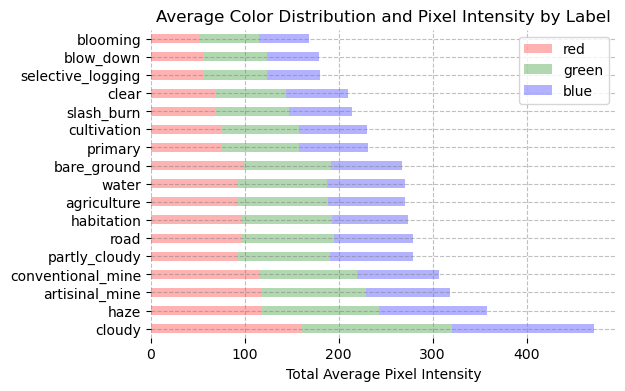

In [29]:
mean_rgb_df.plot(kind='barh', stacked=True, figsize=(6, 4), color=['r', 'g', 'b'], alpha=0.3)
plt.title('Average Color Distribution and Pixel Intensity by Label')
plt.xlabel('Total Average Pixel Intensity')
plt.grid(axis='both', color='gray', linestyle='dashed', alpha=0.5)

# Turn off the frame
ax = plt.gca()
for spine in ax.spines.values():
    spine.set_visible(False)

plt.show()

## Generating an average image for each category (pixel by pixel)

In [30]:
image_size = (256, 256, 3)
avg_image_dict = {}


for label, image_names in image_names_dict.items():
    # Create a numpy array of floats to store the average
    avg_image=np.zeros(image_size,np.float)

    for image in image_names:
        image_array = load_image(image)
        avg_image = avg_image + image_array
    
    num_images = len(image_names)
    avg_image_dict[label] = avg_image/num_images
    print('Processed label: ', label)

Processed label:  agriculture
Processed label:  artisinal_mine
Processed label:  bare_ground
Processed label:  blooming
Processed label:  blow_down
Processed label:  clear
Processed label:  cloudy
Processed label:  conventional_mine
Processed label:  cultivation
Processed label:  habitation
Processed label:  haze
Processed label:  partly_cloudy
Processed label:  primary
Processed label:  road
Processed label:  selective_logging
Processed label:  slash_burn
Processed label:  water


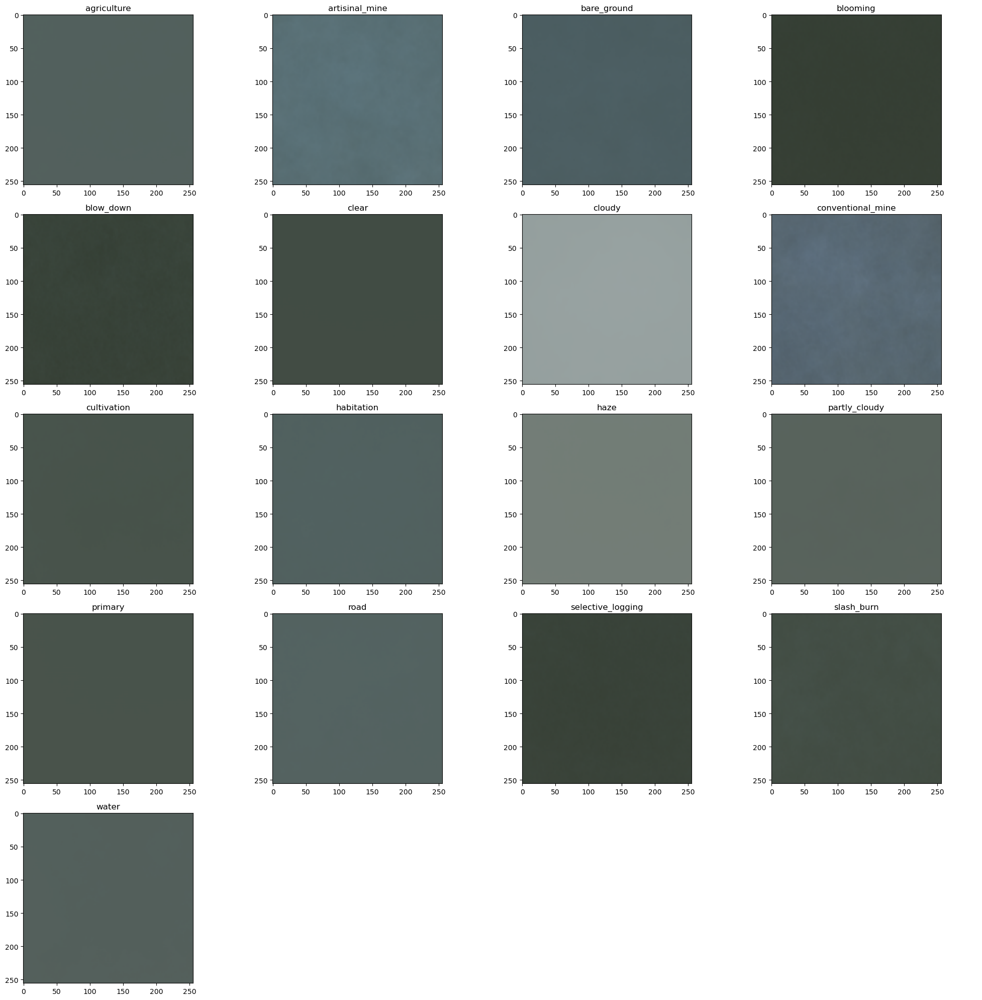

In [31]:
import matplotlib.pyplot as plt
import math
import numpy as np

nrow = 5
ncol = 4
plt.rcParams["axes.grid"] = False
fig, ax = plt.subplots(nrow, ncol, figsize=(20, 20))

# Hide all axes initially
for row in ax:
    for col in row:
        col.axis('off')

i = 0

for label, avg_image in avg_image_dict.items():
    # Check if there's data to plot
    if avg_image.size > 0 and avg_image is not None:
        # Display image and corresponding label
        avg_image = np.array(np.round(avg_image), dtype=np.uint8)
        row = math.floor(i / ncol)
        col = i % ncol
        ax[row, col].imshow(avg_image)
        ax[row, col].set_title(label)
        ax[row, col].axis('on')  # Only turn on axis for valid plots
        plt.imsave('avg_image_{}.jpg'.format(label), avg_image)
        i += 1

plt.tight_layout()

# Save the entire figure as a PNG file
plt.savefig('average_images_grid.png')

plt.show()


---

## Contrast Between Average Images

The code to compute the contrast between average images is based on the approach describe on [Byeon's article at Towards Data Science Portal](https://towardsdatascience.com/exploratory-data-analysis-ideas-for-image-classification-d3fc6bbfb2d2).

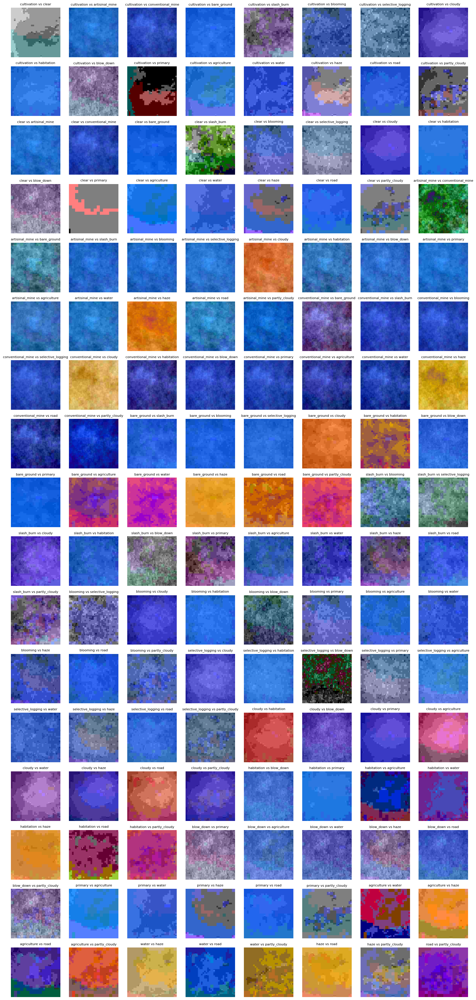

In [32]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from itertools import combinations

def calculate_pixelwise_contrast(image1, image2):
    # Calculate the absolute difference in pixel values
    contrast_image = np.abs(image1.astype('float') - image2.astype('float'))
    # Normalize the values to the 0-255 range
    contrast_image = cv2.normalize(contrast_image, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
    return contrast_image

# Assuming all images are in the current working directory
image_files = [file for file in os.listdir('.') if file.startswith('avg_image_') and file.endswith('.jpg')]

# Calculate the number of unique pairs
num_images = len(image_files)
num_unique_pairs = num_images * (num_images - 1) // 2

# Set the number of columns for your subplot grid
num_columns = 8
# Calculate the necessary number of rows to fit all the pairs
num_rows = np.ceil(num_unique_pairs / num_columns).astype(int)

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(2 * num_columns, 2 * num_rows))

# Flatten the array of axes for easy iteration
axes = axes.flatten()

# Index for current subplot
subplot_idx = 0

# Loop through all unique pairs of images and plot them
for image_file1, image_file2 in combinations(image_files, 2):
    # Load the images
    image1 = cv2.imread(image_file1)
    image2 = cv2.imread(image_file2)

    # Check if images are loaded properly
    if image1 is not None and image2 is not None:
        # Calculate pixel-wise contrast
        contrast_img = calculate_pixelwise_contrast(image1, image2)

        # Plot the contrast image in a subplot
        ax = axes[subplot_idx]
        ax.imshow(cv2.cvtColor(contrast_img, cv2.COLOR_BGR2RGB))
        ax.set_title(f'{image_file1[10:-4]} vs {image_file2[10:-4]}', fontsize=8)
        ax.axis('off')
        
        subplot_idx += 1

# Hide any unused subplots
for ax in axes[subplot_idx:]:
    ax.axis('off')

# Adjust the layout
plt.tight_layout()

plt.savefig('average_difference.png')

plt.show()

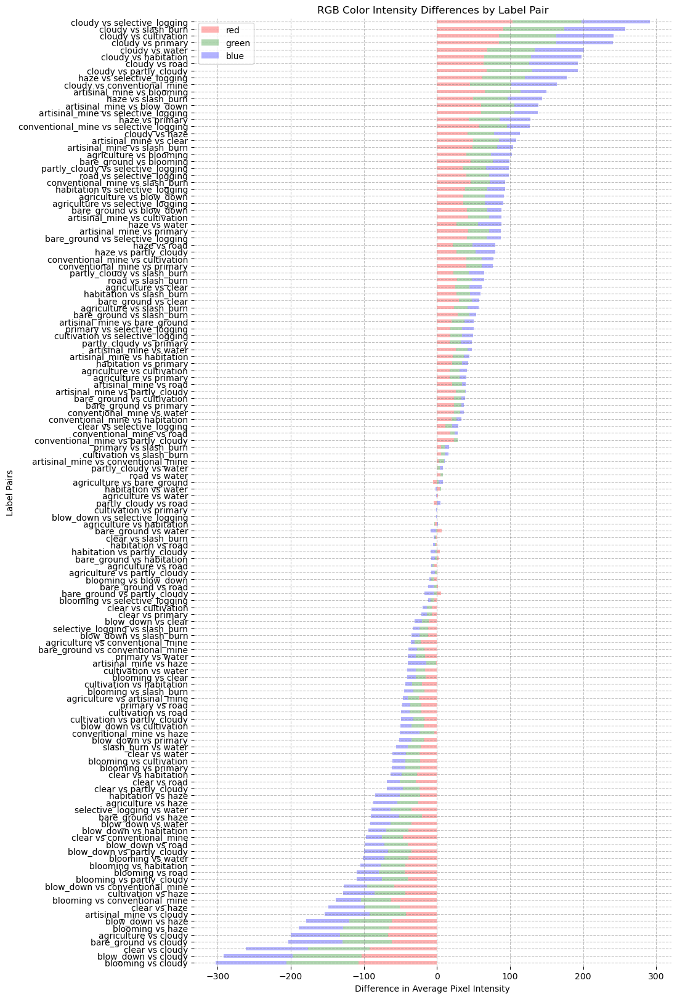

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Calculate the RGB differences for each label pair
def calculate_rgb_differences(mean_rgb_label_dict):
    rgb_differences = {}
    for (label1, rgb1), (label2, rgb2) in combinations(mean_rgb_label_dict.items(), 2):
        diff = {color: rgb1[color] - rgb2[color] for color in ['red', 'green', 'blue']}
        rgb_differences[f'{label1} vs {label2}'] = diff
    return rgb_differences

# Function to plot RGB differences
def plot_rgb_differences(rgb_differences):
    # Convert the dictionary to a DataFrame for plotting
    diff_df = pd.DataFrame(rgb_differences).T

    # Calculate the total difference by summing the absolute differences of the RGB values
    diff_df['total_difference'] = diff_df[['red', 'green', 'blue']].sum(axis=1)
    
    # Sort the DataFrame based on the total difference in ascending order
    diff_df_sorted = diff_df.sort_values(by='total_difference', ascending=True)

    # Plot
    diff_df_sorted[['red', 'green', 'blue']].plot(kind='barh', stacked=True, figsize=(10, 20), color=['r', 'g', 'b'], alpha=0.3)
    plt.title('RGB Color Intensity Differences by Label Pair')
    plt.xlabel('Difference in Average Pixel Intensity')
    plt.ylabel('Label Pairs')
    plt.grid(axis='both', color='gray', linestyle='dashed', alpha=0.5)

    # Turn off the frame
    ax = plt.gca()
    for spine in ax.spines.values():
        spine.set_visible(False)

    plt.show()

# Example usage:
rgb_differences = calculate_rgb_differences(mean_rgb_label_dict)
plot_rgb_differences(rgb_differences)



---

## Eigenimages

The code to compute the Eigenimages is based on the approach describe on [Byeon's article at Towards Data Science Portal](https://towardsdatascience.com/exploratory-data-analysis-ideas-for-image-classification-d3fc6bbfb2d2).

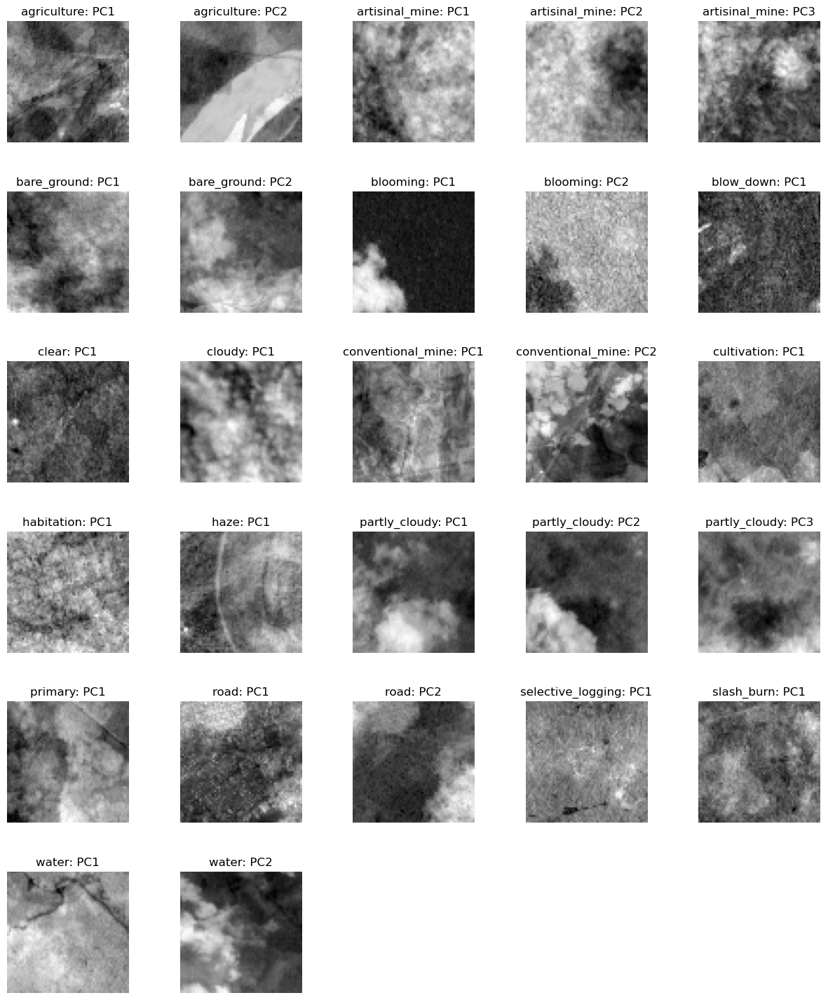

In [34]:
from tensorflow.keras.preprocessing import image as keras_image  # Import the image module correctly
from sklearn.decomposition import PCA 

# Create a dictionary to store image names for each label
image_names_dict = {label: one_hot_encoded_df_with_names[one_hot_encoded_df_with_names[label] == 1]['image_name'].tolist() 
                    for label in one_hot_encoded_df_with_names.columns[1:]}  # Skipping 'image_name' column

# Create a dictionary to store image names for each label
image_names_dict = {label: one_hot_encoded_df_with_names[one_hot_encoded_df_with_names[label] == 1]['image_name'].tolist()
                    for label in one_hot_encoded_df_with_names.columns[1:]}  # Skipping 'image_name' column

# Select a subset of images randomly for each label
selected_images_dict = {label: np.random.choice(filenames, 10, replace=False)
                        for label, filenames in image_names_dict.items() if len(filenames) > 0}

# Define the load_image function
def load_image(image_name, size=(64, 64)):
    path = f'kaggle/planet/planet/train-jpg/{image_name}.jpg'
    current_image = keras_image.load_img(path, target_size=size, color_mode='grayscale')
    img_ts = keras_image.img_to_array(current_image)
    img_ts = img_ts.ravel()
    return img_ts

# Function to convert selected image filenames to a numpy array
def images_to_np_array(filenames, size=(64, 64)):
    return np.array([load_image(fn, size) for fn in filenames])

# Function to get PCA components
def get_pca_components(images_matrix, n_comp=0.7):
    pca = PCA(n_components=n_comp, whiten=True)
    pca.fit(images_matrix)
    return pca.components_

# Dictionary to store all PCA components for each label
all_pca_components = {}

# Calculate PCA components for each label
for label, filenames in selected_images_dict.items():
    images_matrix = images_to_np_array(filenames)
    components = get_pca_components(images_matrix)
    all_pca_components[label] = components

# Plotting all components in a grid
def plot_all_pca_components(all_pca_components, size=(64, 64)):
    # Total number of components to plot
    total_components = sum(comp.shape[0] for comp in all_pca_components.values())
    
    cols = 5  # Number of columns
    rows = ceil(total_components / cols)  # Number of rows

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    axes = axes.flatten()
    plt.subplots_adjust(hspace=0.4, wspace=0.4)

    idx = 0
    for label, components in all_pca_components.items():
        for i in range(components.shape[0]):
            ax = axes[idx]
            ax.imshow(components[i].reshape(size), cmap='gray')
            ax.set_title(f'{label}: PC{i+1}', fontsize=12)
            ax.axis('off')
            idx += 1

    # Hide any unused subplots
    for ax in axes[idx:]:
        ax.axis('off')

    plt.savefig('Eigenimages.png')
    plt.show()

# Call the function to plot the grid
plot_all_pca_components(all_pca_components)


The principal component analysis (PCA) was applied to the labeled satelite image datasets to distill the most significant visual features into eigenimages. These eigenimages serve as abstract representations of the underlying patterns and textures that characterize each category, such as 'agriculture', 'artisinal_mine', 'bare_ground', among others. Notably, the presence of multiple principal components for certain labels indicates that a variety of features contribute to the variance within those categories. The eigenimages capture nuances such as the textural patterns of water surfaces in 'water: PC1' or the structural details inherent to 'conventional_mine' categories. Variations in brightness and contrast across the eigenimages suggest differences in lighting conditions and physical features within the categories, providing valuable insight into the elements that define each class. The synthesis of these principal components into a visual grid forms a compelling part of the data exploration process, revealing the essence of the dataset's visual diversity and structure.

---

## Convolution features

### Plots the mean activation per feature map for a specific layer given an input image

The code to vizualize the convolution features is based on the approach describe on [Fabio Graet'z article at Towards Data Science Portal](https://towardsdatascience.com/how-to-visualize-convolutional-features-in-40-lines-of-code-70b7d87b0030).

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

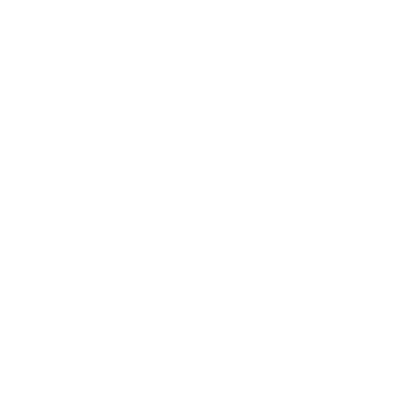

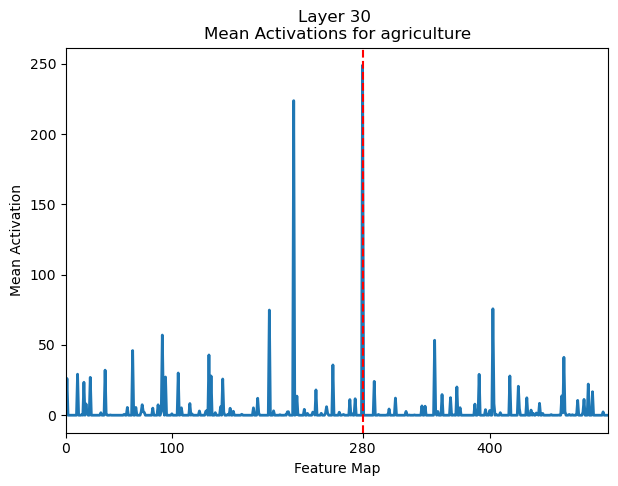

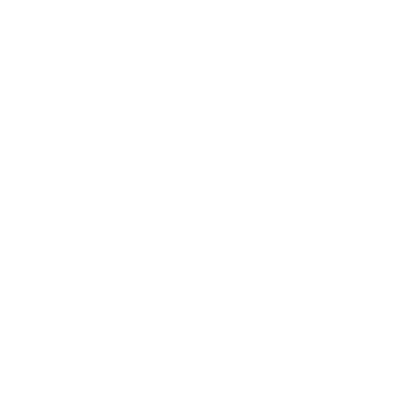

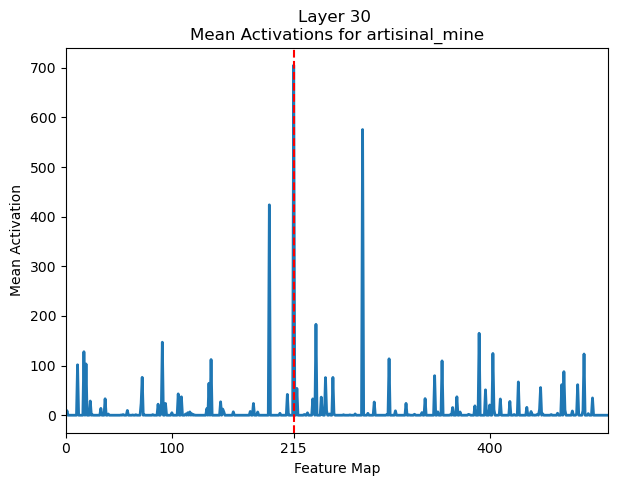

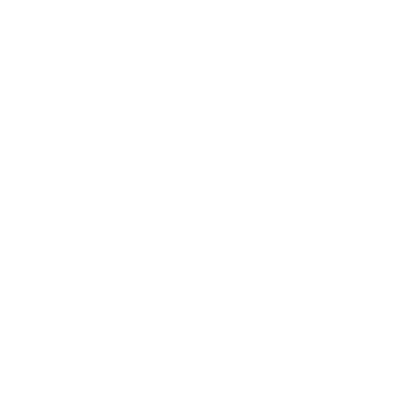

...

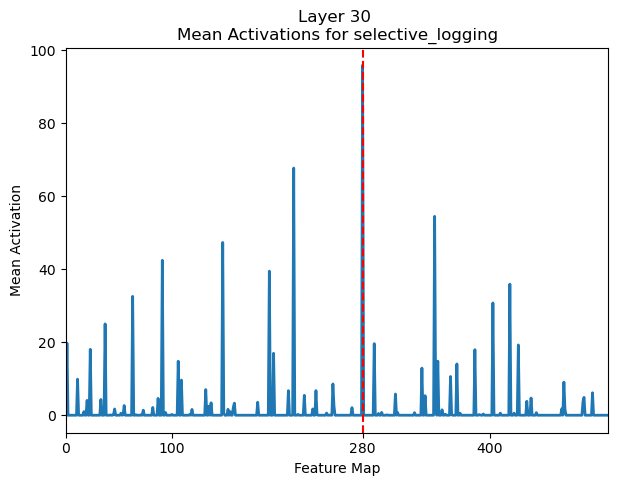

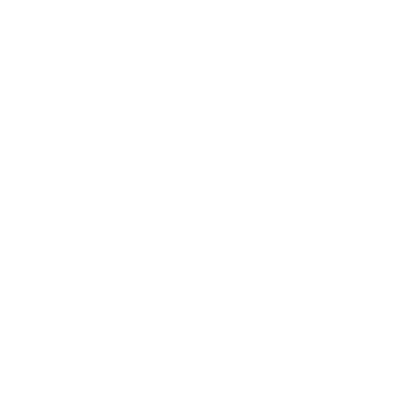

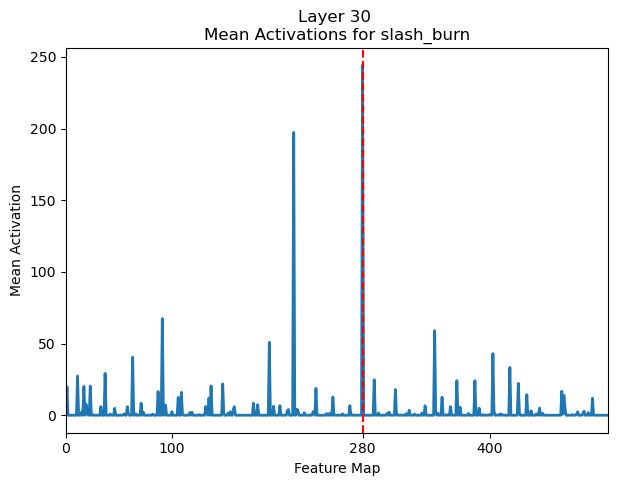

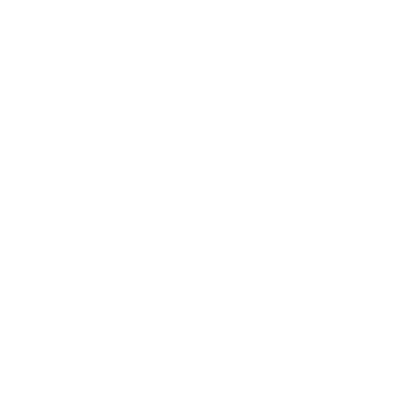

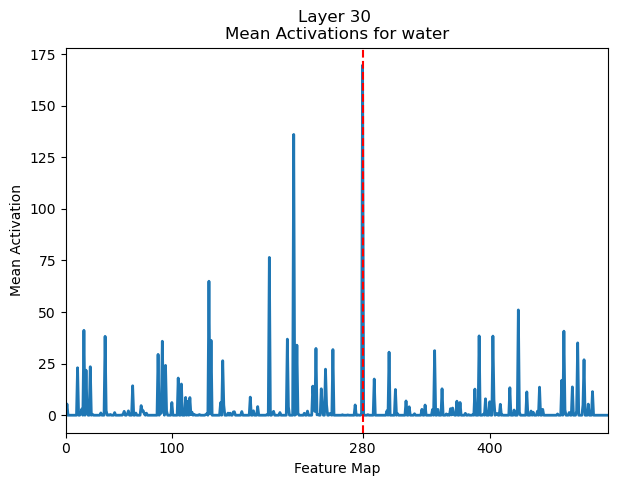

In [84]:
from fastai.vision.all import *
from torchvision.models import vgg16
import PIL
import matplotlib.pyplot as plt
import numpy as np
import torch
from pathlib import Path

# Define the directory where your images are stored
image_dir = Path('kaggle/planet/planet/train-jpg')

# Ensure filenames include the correct extension (e.g., '.jpg')
image_extension = '.jpg'  # Replace with your images' extension

# Create a dictionary to store image names for each label
image_names_dict = {label: one_hot_encoded_df_with_names[one_hot_encoded_df_with_names[label] == 1]['image_name'].tolist()
                    for label in one_hot_encoded_df_with_names.columns[1:]}

# Select one representative image randomly for each label
representative_images = {label: np.random.choice(filenames, 1, replace=False)[0] 
                         for label, filenames in image_names_dict.items() if len(filenames) > 0}

# Load the pretrained VGG16 model
model = vgg16(pretrained=True).eval()

# Define a class to save the features of a particular layer
class SaveFeatures:
    features = None
    def __init__(self, module):
        self.hook = module.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output):
        self.features = output.detach().clone()
    def close(self):
        self.hook.remove()

# Select an appropriate layer of the model
layer_num = 30  # Example layer number, adjust based on model architecture
if layer_num >= len(model.features):
    raise ValueError(f"Layer index {layer_num} is out of range. Model has {len(model.features)} feature layers.")
layer = model.features[layer_num]

# Define transformations
sz = 224
tfms = Normalize.from_stats(*imagenet_stats)

# Define a pipeline that always converts images to RGB
def open_and_convert_to_rgb(fn):
    x = PILImage.create(fn)
    return x.convert('RGB') if x.mode != 'RGB' else x

pipeline = Pipeline([open_and_convert_to_rgb, Resize(sz), ToTensor(), tfms])

# Plot mean activation per feature map for each label
for label, img_name in representative_images.items():
    img_path = image_dir/f'{img_name}.jpg'
    if not img_path.exists():
        print(f"Image file {img_path} not found.")
        continue

    # Process the image
    img = pipeline(img_path)

    # If the image is grayscale (2 dimensions), convert it to RGB
    if img.ndim == 2 or (img.ndim == 3 and img.shape[0] == 1):
        img = img.repeat(3, 1, 1) if img.ndim == 2 else img.repeat(1, 1, 3)

    # Ensure the image has a batch dimension
    batch_img = img.unsqueeze(0) if img.ndim == 3 else img

    # Display the image
    show_image(batch_img[0])

    # Get activations
    activations = SaveFeatures(layer)
    _ = model(batch_img)

    # Compute mean activations
    mean_act = [activations.features[0, i].mean().item() for i in range(activations.features.size(1))]

    # Find the index of the highest peak
    highest_peak_index = np.argmax(mean_act)

    # Plotting
    plt.figure(figsize=(7, 5))
    plt.plot(mean_act, linewidth=2)
    plt.axvline(x=highest_peak_index, color='red', linestyle='--')  # red line for the highest peak
    plt.xlim(0, activations.features.size(1))
    plt.xlabel("Feature Map")
    plt.ylabel("Mean Activation")
    plt.title(f"Layer {layer_num} \nMean Activations for {label}")
    plt.xticks([0, 100, 400, highest_peak_index])
    plt.savefig(f'mean_activation_{label}_layer_{layer_num}.png')

    # Clean up
    activations.close()


Visualizing for label: agriculture, Image: train_22407.jpg
Visualizing for label: artisinal_mine, Image: train_27247.jpg
Visualizing for label: bare_ground, Image: train_5762.jpg
Visualizing for label: blooming, Image: train_21640.jpg
Visualizing for label: blow_down, Image: train_29568.jpg
Visualizing for label: clear, Image: train_14505.jpg
Visualizing for label: cloudy, Image: train_32846.jpg
Visualizing for label: conventional_mine, Image: train_22931.jpg
Visualizing for label: cultivation, Image: train_35349.jpg
Visualizing for label: habitation, Image: train_21725.jpg
Visualizing for label: haze, Image: train_2519.jpg
Visualizing for label: partly_cloudy, Image: train_15507.jpg
Visualizing for label: primary, Image: train_17030.jpg
Visualizing for label: road, Image: train_18189.jpg
Visualizing for label: selective_logging, Image: train_34768.jpg
Visualizing for label: slash_burn, Image: train_5672.jpg
Visualizing for label: water, Image: train_39608.jpg


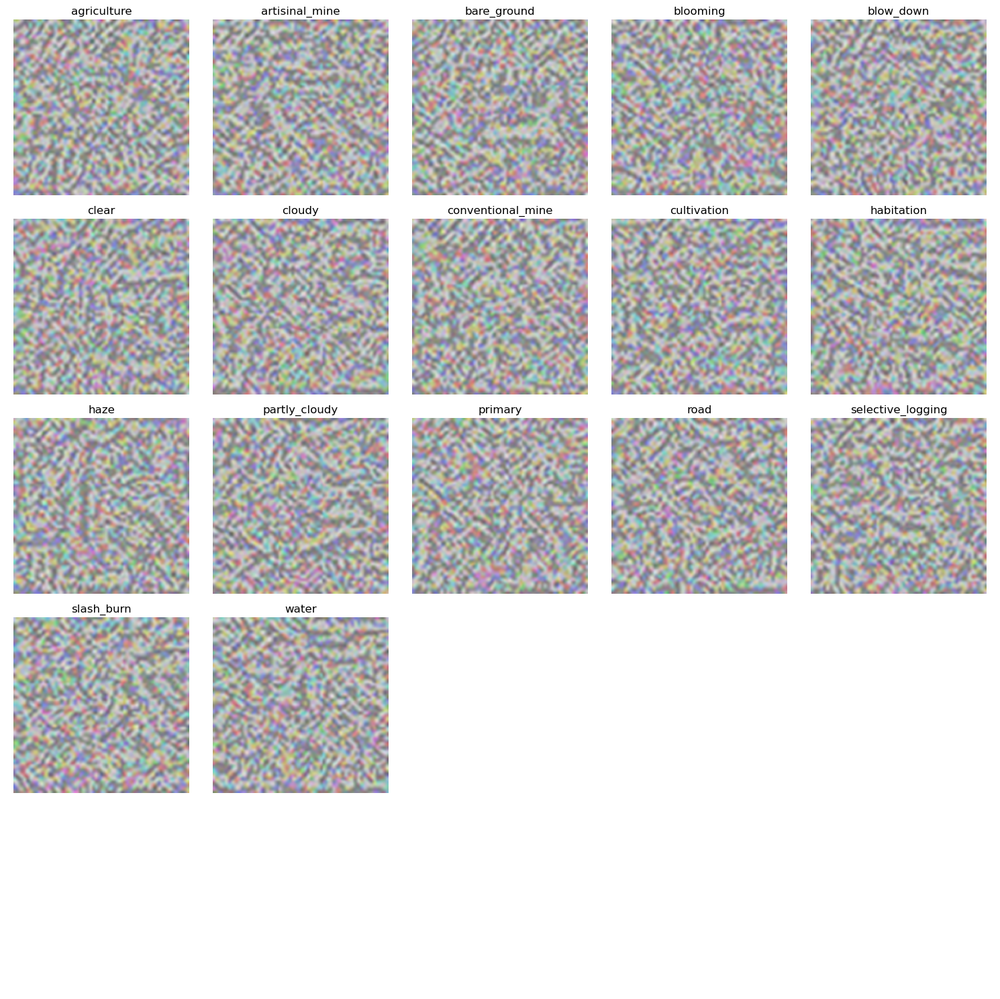

In [89]:
import pandas as pd
import numpy as np
from pathlib import Path
from torchvision import models
import torch
import matplotlib.pyplot as plt
import cv2

# Load your one-hot encoded DataFrame here
# Example: one_hot_encoded_df_with_names = pd.read_csv('your_dataframe.csv')

# Define the directory where your images are stored
image_dir = Path('kaggle/planet/planet/train-jpg')

# Ensure filenames include the correct extension (e.g., '.jpg')
image_extension = '.jpg'

# Create a dictionary to store image names for each label
image_names_dict = {label: one_hot_encoded_df_with_names[one_hot_encoded_df_with_names[label] == 1]['image_name'].tolist()
                    for label in one_hot_encoded_df_with_names.columns[1:]}

# Select one representative image randomly for each label
representative_images = {label: np.random.choice(filenames, 1, replace=False)[0] + image_extension
                         for label, filenames in image_names_dict.items() if len(filenames) > 0}

# Filter Visualization Code
class SaveFeatures:
    def __init__(self, module):
        self.hook = module.register_forward_hook(self.hook_fn)
        self.features = None

    def hook_fn(self, module, input, output):
        self.features = output

    def close(self):
        self.hook.remove()

def visualize_filter(model, layer_idx, filter_idx, img_size, upscaling_steps, upscaling_factor, lr):
    model.eval()

    # Create a random image
    img = np.random.uniform(150, 180, (img_size, img_size, 3)) / 255
    img = torch.from_numpy(img).float().permute(2, 0, 1).unsqueeze(0)
    img.requires_grad_(True)

    # Define optimizer for the image
    optimizer = torch.optim.Adam([img], lr=lr, weight_decay=1e-6)

    # Hook the selected layer
    activation = SaveFeatures(list(model.features.children())[layer_idx])

    for _ in range(upscaling_steps):
        optimizer.zero_grad()
        model(img)
        loss = -activation.features[0, filter_idx].mean()
        loss.backward()
        optimizer.step()

        # Upscale the image
        img_size = int(upscaling_factor * img_size)
        img = img.data.cpu().numpy()[0].transpose(1, 2, 0)
        img = cv2.resize(img, (img_size, img_size), interpolation=cv2.INTER_CUBIC)
        img = torch.from_numpy(img).float().permute(2, 0, 1).unsqueeze(0)
        img.requires_grad_(True)

    activation.close()

    # Convert to image and return
    img = img.data.cpu().numpy()[0].transpose(1, 2, 0)
    return np.clip(img, 0, 1)

# Initialize model
model = models.vgg16(pretrained=True).train()

# Visualization parameters
layer_idx = 20
filter_idx = 280 #265
img_size = 56
upscaling_steps = 12
upscaling_factor = 1.2
lr = 0.1

# Determine the grid size for subplots
num_labels = len(representative_images)
grid_size = int(np.ceil(np.sqrt(num_labels)))

# Create subplots
fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))
axes = axes.flatten()  # Flatten the array of axes for easy indexing

# Visualize filter for each representative image and plot in subplots
for i, (label, img_name) in enumerate(representative_images.items()):
    print(f"Visualizing for label: {label}, Image: {img_name}")
    img = visualize_filter(model, layer_idx, filter_idx, img_size, upscaling_steps, upscaling_factor, lr)
    if isinstance(img, np.ndarray):
        axes[i].imshow(img)
        axes[i].set_title(label)
        axes[i].axis('off')  # Turn off axis

# Hide any unused axes
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()
